# A Simple HPSS (Harmonic-Percussive Source Separation) Application Example
## Separating the drums from the guitar in the Introduction of: 
## ACDC - Back in Black
### Renato Profeta - PhD Candidate - [TU Ilmenau](https://www.tu-ilmenau.de/en/applied-media-systems-group/)

*The excerpts of songs used in this jupyter notebook are for educational purposes only. 
This jupyter notebook is based on [musicinformationretrieval.com](https://musicinformationretrieval.com/index.html).

## General Idea about HPSS
The main idea behind harmonic-percussive source separation is that when looking at the spectogram of a piece of audio, harmonic events tend to have horizontal structure while percusive sounds tend to have vertical structures. The HPSS technique takes advantage of these characteristics and use filtering in both vertical and horizontal directions.
For more information on NMF, check out section 8.1 of [Fundamentals of Music Processing book](https://www.audiolabs-erlangen.de/fau/professor/mueller/bookFMP), by Meinard Müller.



As usual let's import the Python Packages we'll use.

In [1]:
# Import Python Packages
import seaborn
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd
import librosa, librosa.display

#Other Configurations
%matplotlib notebook
#jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000000  - Open jupyter notebook setting iopub_data_rate

Now we'll import a very poor midi version of the drums of ACDC - Back in Black converted to .wav, play it back and look at its spectogram.

In [2]:
# Importing audio file
filename = 'ACDC-Back in Black Intro_DRUMS.wav'
x, fs = librosa.load(filename)

In [3]:
# Playback audio file
ipd.Audio(x, rate=fs)

Once the audio file is loaded, let's grab some information about the audio data.

In [4]:
# Audio data information
print("x Shape=", x.shape)
print("Sample rate fs=", fs)
print("Audio Lenght in seconds=%d [s]" % (x.shape[0]/fs))

x Shape= (702810,)
Sample rate fs= 22050
Audio Lenght in seconds=31 [s]


<IPython.core.display.Javascript object>


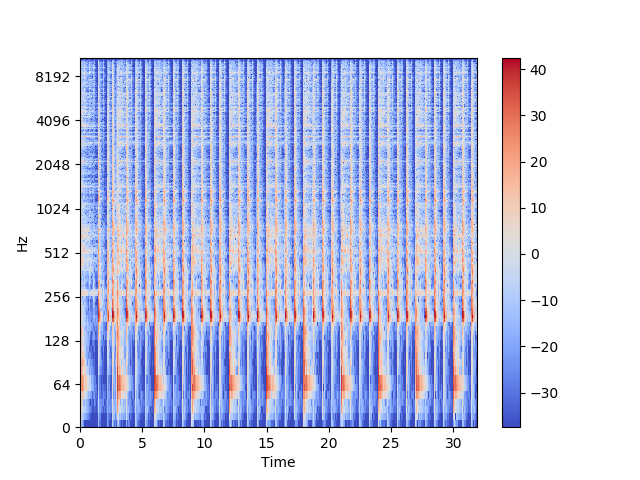

In [5]:
#STFT
X = librosa.stft(x)
Xmag = librosa.amplitude_to_db(X)
plt.figure()
librosa.display.specshow(Xmag, sr=fs, x_axis='time', y_axis='log')
plt.colorbar();

It's possible to observe that the drums have many vertical structures by looking at the specogram.
Let's now do the same with a very poor midi file converted to .wav for the guitar.

In [6]:
# Importing audio file
filename = 'ACDC-Back in Black Intro_GUITAR.wav'
x, fs = librosa.load(filename)

In [7]:
# Playback audio file
ipd.Audio(x, rate=fs)

<IPython.core.display.Javascript object>


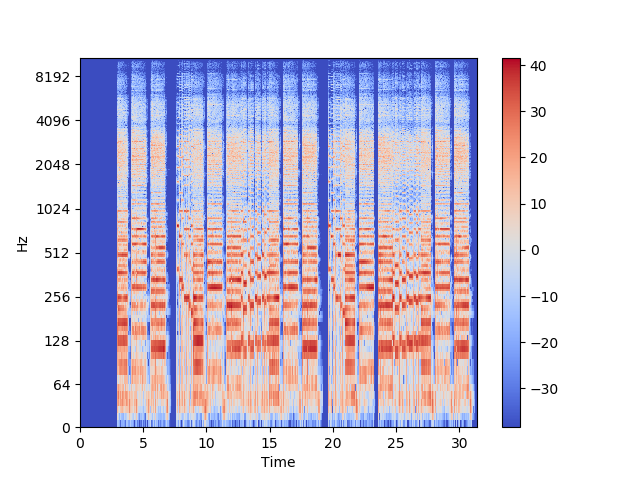

In [8]:
#STFT
X = librosa.stft(x)
Xmag = librosa.amplitude_to_db(X)
plt.figure()
librosa.display.specshow(Xmag, sr=fs, x_axis='time', y_axis='log')
plt.colorbar();

Now we see more horizontal structure than before. It's important to have in mind that the stricking of a guitar string with a guitar pick also generates a percusive component in its sound.
We can now move on to importing the original version of ACDC - Back in Black introduction and take a look at its spectogram.

In [9]:
# Importing audio file
filename = 'ACDC - Back In Black Intro.wav'
x, fs = librosa.load(filename)
# Playback audio file
ipd.Audio(x, rate=fs)

<IPython.core.display.Javascript object>


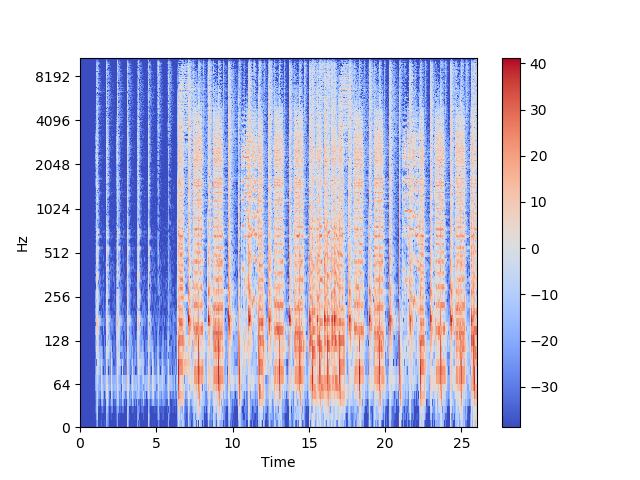

In [10]:
#STFT
X = librosa.stft(x)
Xmag = librosa.amplitude_to_db(X)
plt.figure()
librosa.display.specshow(Xmag, sr=fs, x_axis='time', y_axis='log')
plt.colorbar();

It's time to compute the HPSS and display each separate component.

In [11]:
# HPSS
H, P = librosa.decompose.hpss(X)
Hmag = librosa.amplitude_to_db(H)
Pmag = librosa.amplitude_to_db(P)

## Harmonic Component

<IPython.core.display.Javascript object>


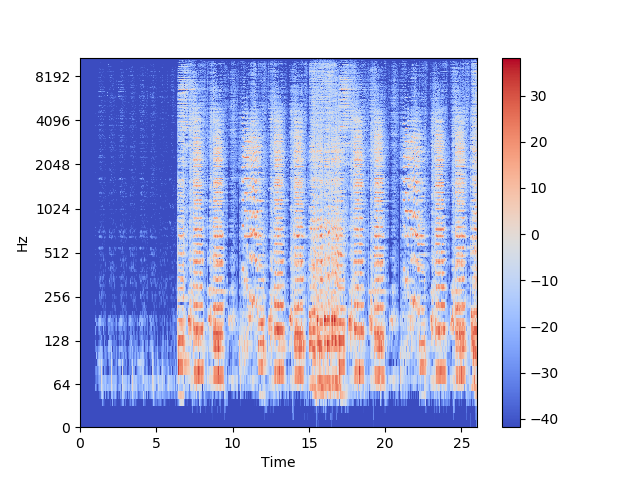

In [12]:
# Plot the Harmonic Component
plt.figure()
librosa.display.specshow(Hmag, sr=fs, x_axis='time', y_axis='log')
plt.colorbar();

We can reconstruct the audio by taking the inverse STFT and we can listen to it.

In [13]:
# ISTFT
h = librosa.istft(H)
# Playback audio file
ipd.Audio(h, rate=fs)

We can hear that the drums sounds were attenuated but we didn't achieve a good separation between drums and guitar.

## Percusive Component

<IPython.core.display.Javascript object>


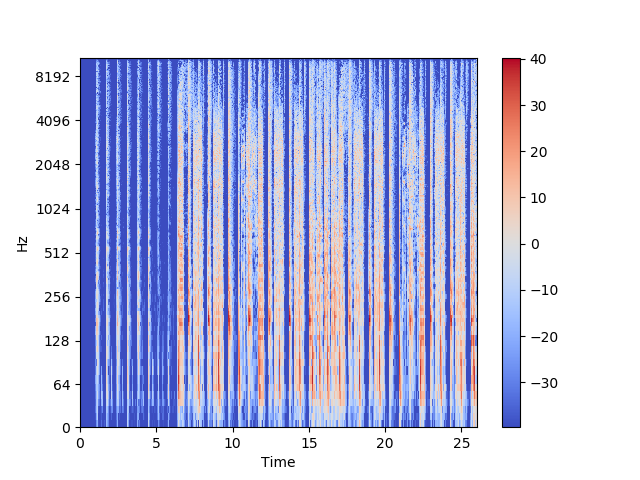

In [14]:
# Plot the Percusive Component
plt.figure()
librosa.display.specshow(Pmag, sr=fs, x_axis='time', y_axis='log')
plt.colorbar();

In [15]:
# ISTFT
p = librosa.istft(P)
# Playback audio file
ipd.Audio(p, rate=fs)

We can hear that the guitar sound was attenuated but we didn't achieve a very good separation.

Let's try to tweak the hpss parameters in order to see if we can improve our results.

In [16]:
# HPSS
H, P = librosa.decompose.hpss(X,kernel_size=(50, 50),margin=(10.0,10.0))
Hmag = librosa.amplitude_to_db(H)
Pmag = librosa.amplitude_to_db(P)

<IPython.core.display.Javascript object>


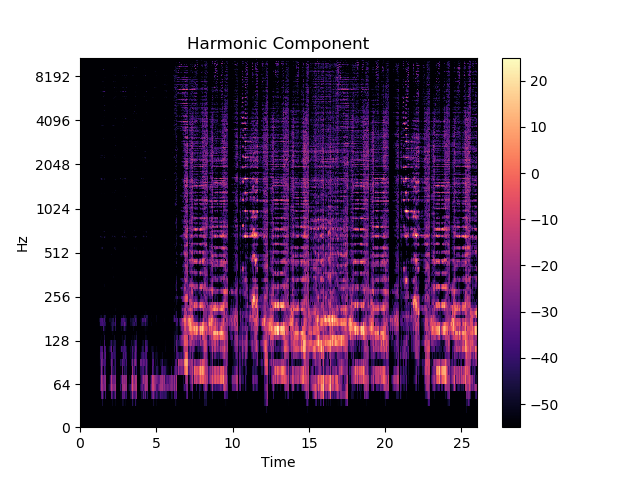

In [17]:
# Plot the Harmonic Component
plt.figure()
plt.title('Harmonic Component')
librosa.display.specshow(Hmag, sr=fs, x_axis='time', y_axis='log')
plt.colorbar();

In [18]:
# ISTFT
h = librosa.istft(H)
# Playback audio file
print('Harmonic Component')
ipd.Audio(h, rate=fs)

Harmonic Component


With those paramenters we achieve a slight better separation but we loose information about the attack of the guitar.

<IPython.core.display.Javascript object>


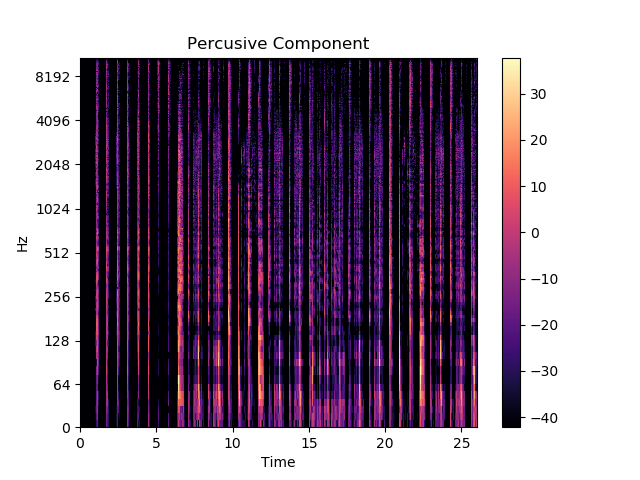

In [19]:
# Plot the Percusive Component
plt.figure()
plt.title('Percusive Component')
librosa.display.specshow(Pmag, sr=fs, x_axis='time', y_axis='log')
plt.colorbar();

In [20]:
# ISTFT
p = librosa.istft(P)
# Playback audio file
print('Percusive Component')
ipd.Audio(p, rate=fs)

Percusive Component


Now the guitar is more attenuated and the drums are more prominent.

## Anoter example: Procol Harum - A Whiter Shade of Pale
In this example, we'll try to separate the keyboard from the drums. Note that the keyboard in this song has much less percussive components than the guitar in Back in Black.

In [21]:
# Importing audio file
filename = 'A Whiter Shade Of Pale - Procol Harum Intro.wav'
x, fs = librosa.load(filename)
ipd.Audio(x, rate=fs)

In [22]:
#STFT
X = librosa.stft(x)
H, P = librosa.decompose.hpss(X)
p = librosa.istft(P)
h = librosa.istft(H)
print('Harmonic Component')
ipd.display(ipd.Audio(h, rate=fs))
print('Percusive Component')
ipd.display(ipd.Audio(p, rate=fs))

Harmonic Component


Percusive Component


We can hear that the separation of drums and keyboard for this particular piece of music has much better results. This keyboard has much less percusive components than the guitar and this technique achieves a much better separation than the previous example.